In [1]:
# Import necessary libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve,auc

import warnings
warnings.filterwarnings('ignore')

In [2]:
# Load dataset and convert into dataframe
data = pd.read_csv('Telecom_customer_churn.csv')
#Looking into first 5 rows
data.head() 

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [3]:
# display Maximum rows
pd.set_option('display.max.rows',None)

In [4]:
# Checking columns name
data.columns

Index(['customerID', 'gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'tenure', 'PhoneService', 'MultipleLines', 'InternetService',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
       'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling',
       'PaymentMethod', 'MonthlyCharges', 'TotalCharges', 'Churn'],
      dtype='object')

In [5]:
# Checking shape of dataset
data.shape

(7043, 21)

In [6]:
# There are 7043 rows & 21 Columns

In [7]:
#Checking the datatype of each attribute
data.dtypes

customerID           object
gender               object
SeniorCitizen         int64
Partner              object
Dependents           object
tenure                int64
PhoneService         object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges         object
Churn                object
dtype: object

In [8]:
# Identifing the type of Problem- Output: Churn is object data so we use classification models

In [9]:
#removing duplicate values
data.drop_duplicates(inplace = True)

In [10]:
# Checking  shape After removing Duplicated
data.shape

(7043, 21)

In [11]:
# There is no duplicate present in dataset

In [12]:
# Checking Null values of each attributes
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   int64  
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


In [13]:
# There is no null value present

In [14]:
# Checking missing values of each attributes
data.isna().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

In [15]:
#There is no value present in dataset

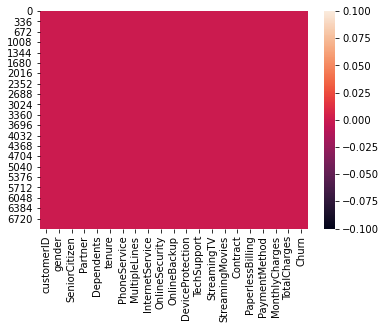

In [16]:
#Looking for missing value
sns.heatmap(data.isna())
plt.show()

In [17]:
#There is missing  value present in dataset

In [18]:
# Checking statistics summary
data.describe()

,SeniorCitizen,tenure,MonthlyCharges
count,7043.000000,7043.000000,7043.000000
mean,0.162147,32.371149,64.761692
std,0.368612,24.559481,30.090047
min,0.000000,0.000000,18.250000
25%,0.000000,9.000000,35.500000
50%,0.000000,29.000000,70.350000
75%,0.000000,55.000000,89.850000
max,1.000000,72.000000,118.750000


In [19]:
# The  show SeniorCitizen & tenure  largest difference between 75% and max

In [20]:
data['Churn'].value_counts()

No     5174
Yes    1869
Name: Churn, dtype: int64

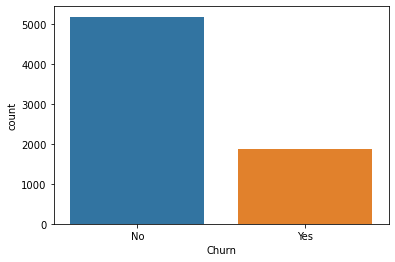

In [21]:
sns.countplot(data['Churn'])
plt.show()

In [22]:
# Not Churn Customer is more & Churn Customer is less
# There is data imbalance problem present in dataset

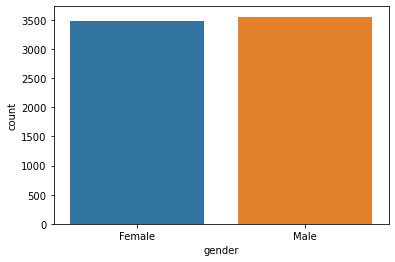

In [23]:
sns.countplot(data['gender'])
plt.show()

In [24]:
# There is equal number of male and female customer

In [25]:
data['SeniorCitizen'].value_counts()

0    5901
1    1142
Name: SeniorCitizen, dtype: int64

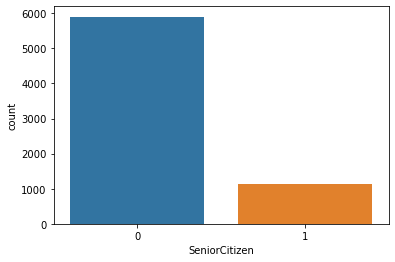

In [26]:
sns.countplot(data['SeniorCitizen'])
plt.show()

In [27]:
#  Less number of SeniorCitizen  are churn Customer
#  Maximum number of SeniorCitizen  are not  churn Customer

In [28]:
data['Partner'].value_counts()

No     3641
Yes    3402
Name: Partner, dtype: int64

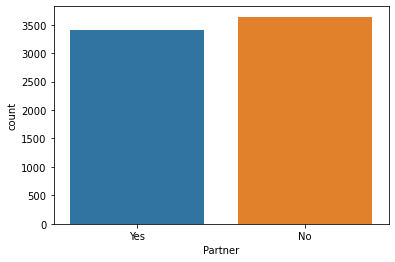

In [29]:
sns.countplot(data['Partner'])
plt.show()

In [30]:
#There are 3402  partner are churn Customer  and 3641 partner are not churn Customer

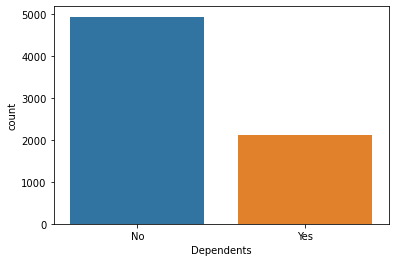

In [31]:
sns.countplot(data['Dependents'])
plt.show()

In [32]:
# There are maximum not Dependents customer   and less are Dependents Customer 

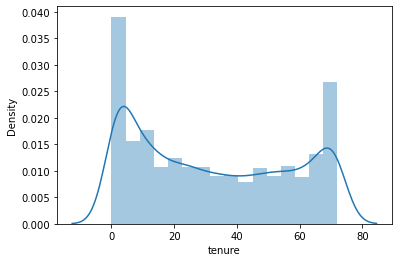

In [33]:
sns.distplot(data['tenure'])
plt.show()

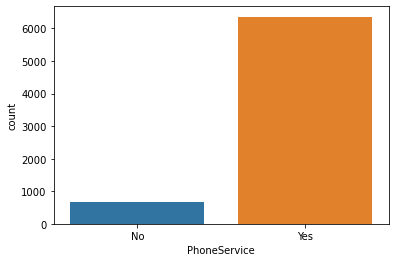

In [34]:
sns.countplot(data['PhoneService'])
plt.show()

In [35]:
#  Phoneservice of churn customer are more

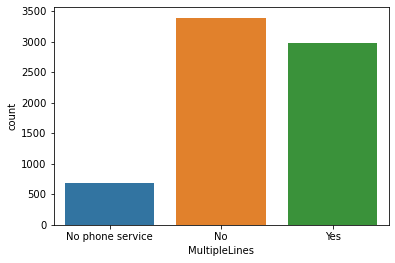

In [36]:
sns.countplot(data['MultipleLines'])
plt.show()

In [37]:
# Maximum customer are not multiplies line
# Most of Customer have multiple line
# Only Minimum numbe of customer are no phone service

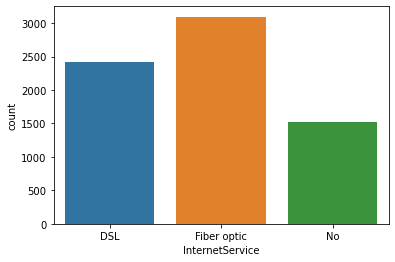

In [38]:
sns.countplot(data['InternetService'])
plt.show()

In [39]:
# Maximum customer are used Fiber optic Internet Service
# Average  Customer are use DSL Internet service and minimum cutsomer are not use internetservice

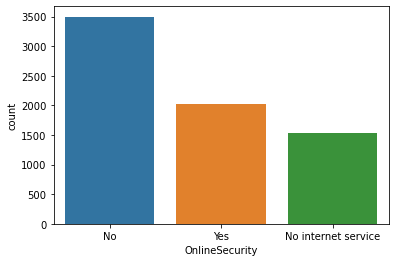

In [40]:
sns.countplot(data['OnlineSecurity'])
plt.show()

In [41]:
data['OnlineSecurity'].value_counts()

No                     3498
Yes                    2019
No internet service    1526
Name: OnlineSecurity, dtype: int64

In [42]:
#3498 customers does not have online security and 2019 customer have internet security, 1526 are not having internet service.

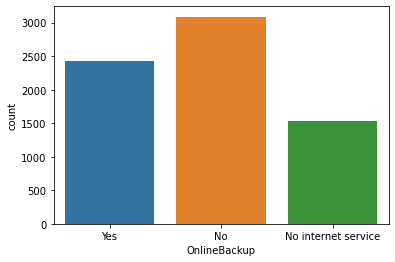

In [43]:
sns.countplot(data['OnlineBackup'])
plt.show()

In [44]:
data['OnlineBackup'].value_counts()

No                     3088
Yes                    2429
No internet service    1526
Name: OnlineBackup, dtype: int64

In [45]:
#3088 customers are not having any online back-up, and 2429 has online backup and 1526 are not having internet services only.

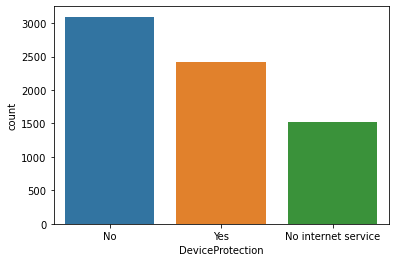

In [46]:
sns.countplot(data['DeviceProtection'])
plt.show()

In [47]:
data['DeviceProtection'].value_counts()

No                     3095
Yes                    2422
No internet service    1526
Name: DeviceProtection, dtype: int64

In [48]:
#3095 customer are not having device protection and 2422 have device protection, 1526 are not having internet services only.

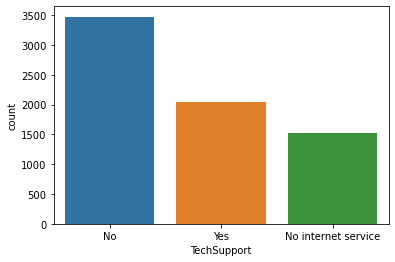

In [49]:
sns.countplot(data['TechSupport'])
plt.show()

In [50]:
data['TechSupport'].value_counts()

No                     3473
Yes                    2044
No internet service    1526
Name: TechSupport, dtype: int64

In [51]:
#3473 customer are not having technical support and 2044 have technical support, 1526 are not having internet services only.

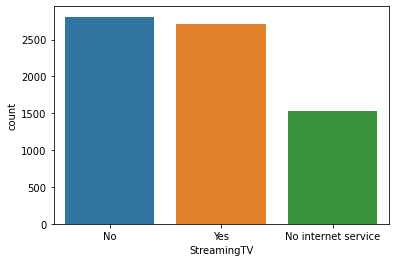

In [52]:
sns.countplot(data['StreamingTV'])
plt.show()

In [53]:
data['StreamingTV'].value_counts()

No                     2810
Yes                    2707
No internet service    1526
Name: StreamingTV, dtype: int64

In [54]:
#2810 customer are not streaming TV and 2707 have streaming TV, 1526 are not having internet services only.

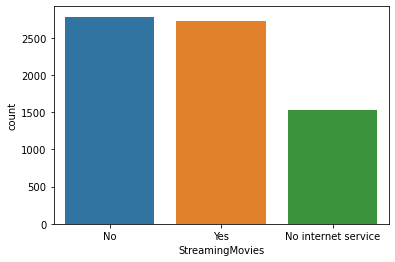

In [55]:
sns.countplot(data['StreamingMovies'])
plt.show()

In [56]:
data['StreamingMovies'].value_counts()

No                     2785
Yes                    2732
No internet service    1526
Name: StreamingMovies, dtype: int64

In [57]:
#2785 customer are not streaming Movies and 2732 have streaming Movies, 1526 are not having internet services only.

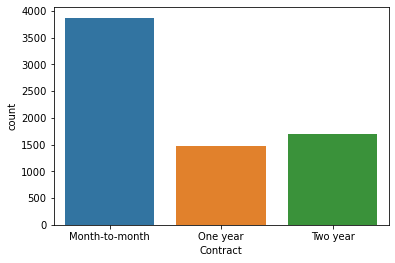

In [58]:
sns.countplot(data['Contract'])
plt.show()

In [59]:
data['Contract'].value_counts()

Month-to-month    3875
Two year          1695
One year          1473
Name: Contract, dtype: int64

In [60]:
#3875 customer are not have month-to-month contract and 1695 have two year contract and 1473 have one-year contract.

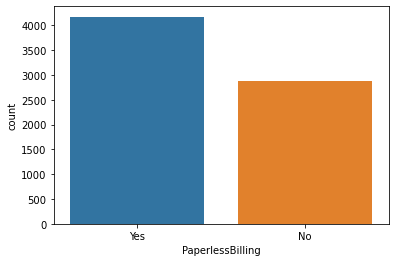

In [61]:
sns.countplot(data['PaperlessBilling'])
plt.show()

In [62]:
#Customer with paperless billing are more and not paperless billing are less.

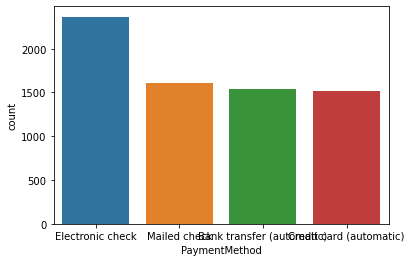

In [63]:
sns.countplot(data['PaymentMethod'])
plt.show()

In [64]:
data['PaymentMethod'].value_counts()

Electronic check             2365
Mailed check                 1612
Bank transfer (automatic)    1544
Credit card (automatic)      1522
Name: PaymentMethod, dtype: int64

In [65]:
#Customer with electronic check payment mode are 2365, mailed check are 1612, paying with bank transfer(automatic) 1544 customer and 1522 are doing payment with credit card (automatic).

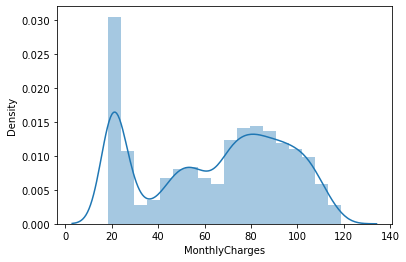

In [66]:
sns.distplot(data['MonthlyCharges'])
plt.show()

In [67]:
# MonthlyCharges look like normal distribution thus it shows that there are some outliers present.

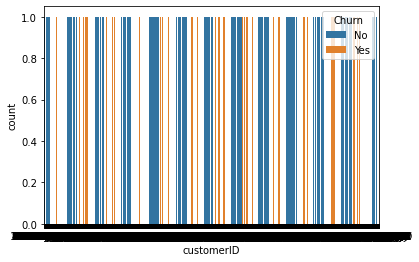

In [68]:
sns.countplot(data['customerID'], hue = data['Churn'])
plt.show()

In [69]:
# Seperate String datypes and numerical datatypes

In [70]:
object_dtypes = []
for i in data.columns:
    if data[i].dtypes=='object':
        object_dtypes.append(i)

In [71]:
object_dtypes

['customerID',
 'gender',
 'Partner',
 'Dependents',
 'PhoneService',
 'MultipleLines',
 'InternetService',
 'OnlineSecurity',
 'OnlineBackup',
 'DeviceProtection',
 'TechSupport',
 'StreamingTV',
 'StreamingMovies',
 'Contract',
 'PaperlessBilling',
 'PaymentMethod',
 'TotalCharges',
 'Churn']

In [72]:
#  Convert object datatype into numerical dtypes
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for j in object_dtypes:
    data[j] = le.fit_transform(data[j])

In [73]:
# Checking Datypes
data.dtypes

customerID            int32
gender                int32
SeniorCitizen         int64
Partner               int32
Dependents            int32
tenure                int64
PhoneService          int32
MultipleLines         int32
InternetService       int32
OnlineSecurity        int32
OnlineBackup          int32
DeviceProtection      int32
TechSupport           int32
StreamingTV           int32
StreamingMovies       int32
Contract              int32
PaperlessBilling      int32
PaymentMethod         int32
MonthlyCharges      float64
TotalCharges          int32
Churn                 int32
dtype: object

In [74]:
#Checking Correlation
cor = data.corr()

In [75]:
# we can understanding properly as we use heatmap to find correleation

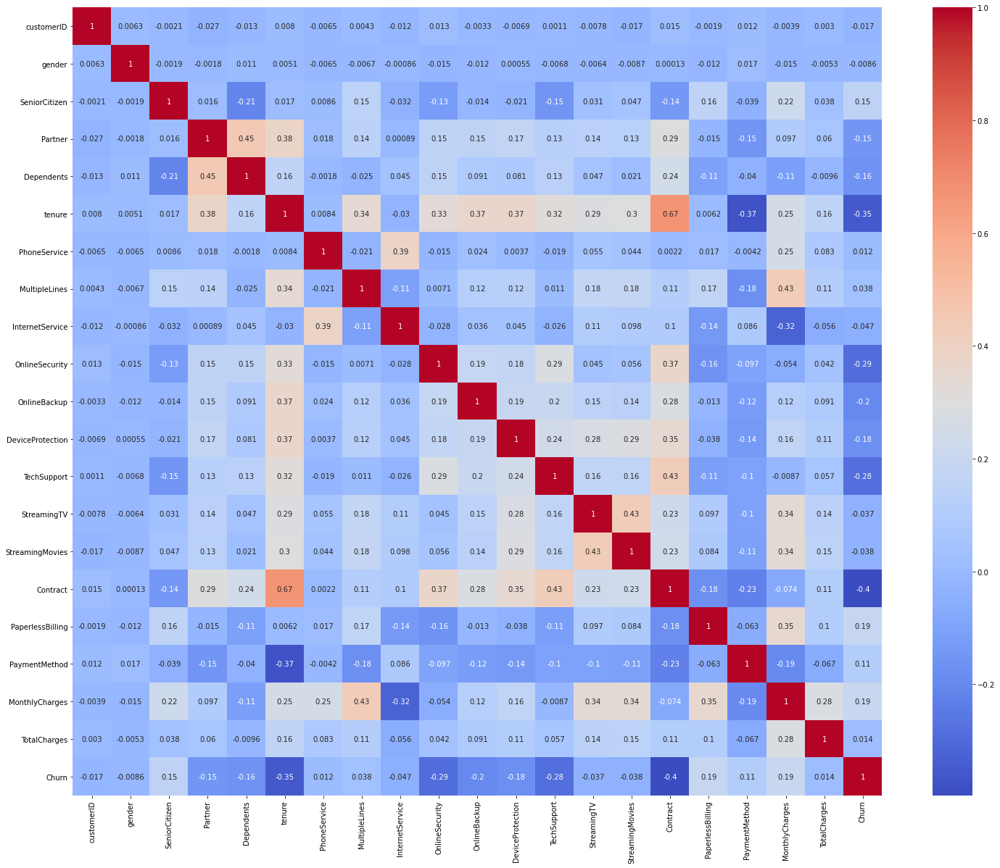

In [76]:
#Checking of correlation of features with each other
plt.figure(figsize=(25,20))
sns.heatmap(data.corr(),cmap='coolwarm',annot=True)
plt.show()

In [77]:
# Contract , tenure, & Techsupport has positive correlationship
# MonthlyCharges and Multioplelines has positive correlationship

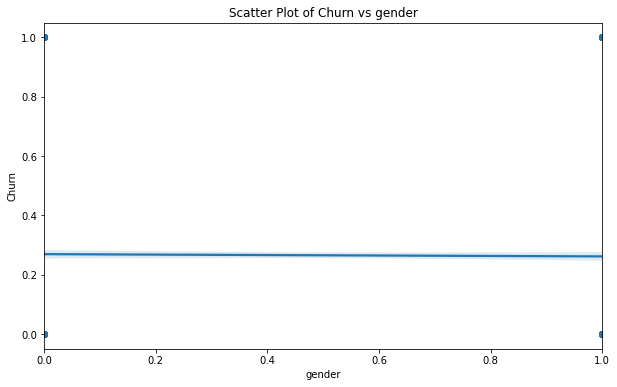

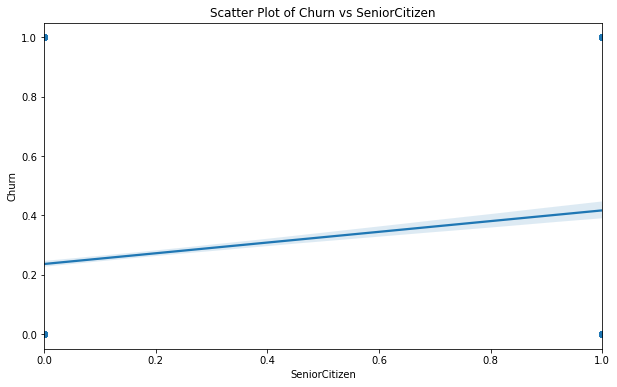

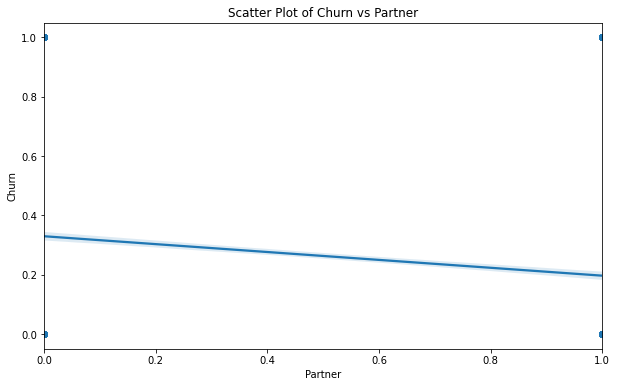

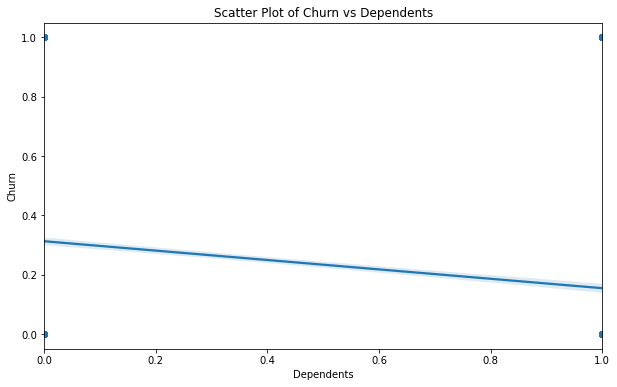

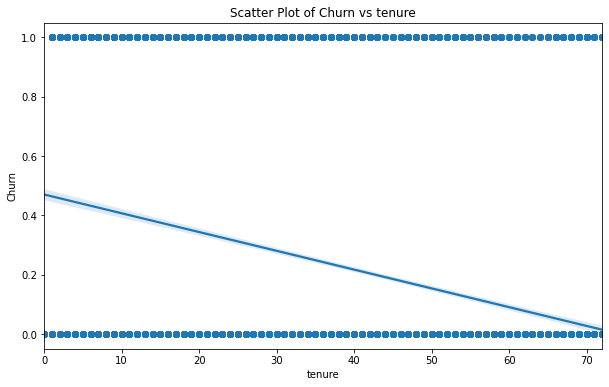

...

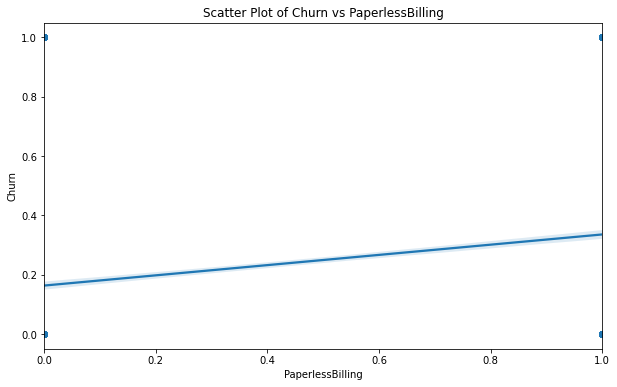

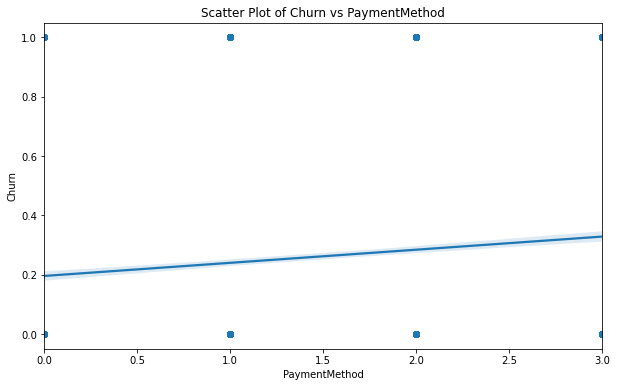

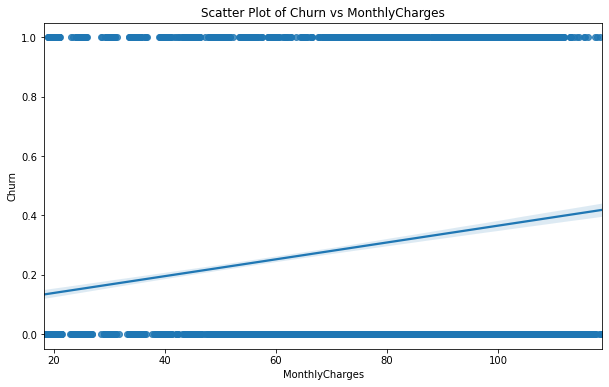

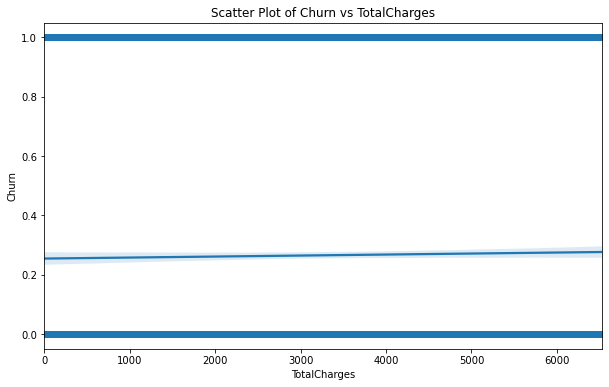

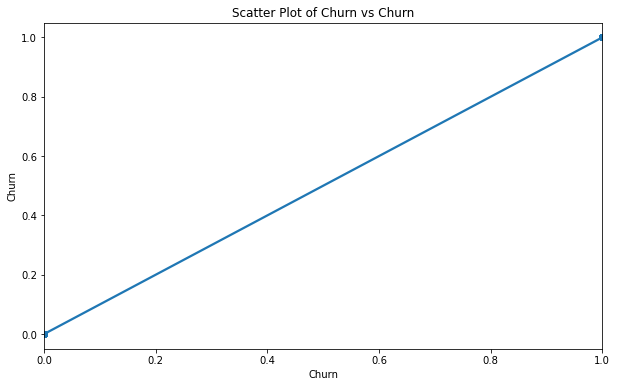

In [78]:
# Let's checking feature vs label relationship
collist=data.columns.values
for i in range(1,len(collist)):
    plt.figure(figsize = (10,6))
    sns.regplot(data[collist[i]], data['Churn'])
    plt.title('Scatter Plot of Churn vs %s' %(collist[i]))
    plt.xlabel(collist[i])
    plt.ylabel('Churn')
    plt.show()

In [79]:
# 'CustomerID', 'gender', 'SeniorCitizen',phoneservice', 'multiplelines'PaperlessBilling','PaymentMethod','TotalCharges',have positive correlationship with churn

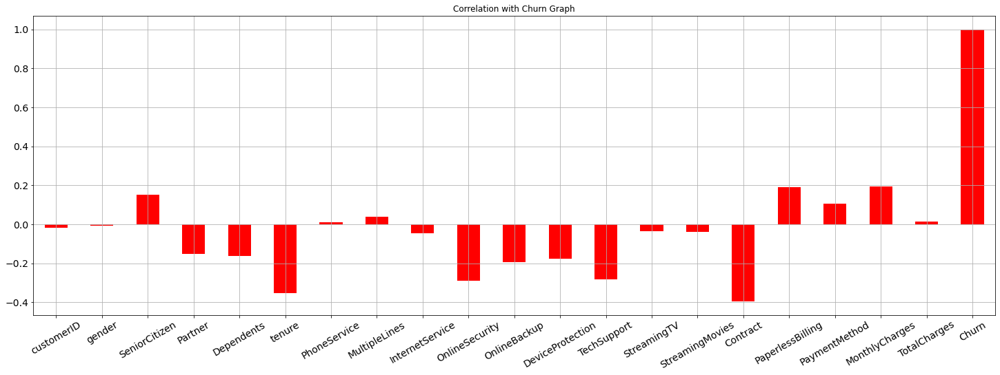

In [80]:
#Correlation with Win with respect to attributes
data.corrwith(data.Churn).plot(kind ='bar',color = 'r',figsize = (25, 8), 
                               title = "Correlation with Churn Graph", 
                               fontsize = 14,rot = 30, grid = True)
plt.show()

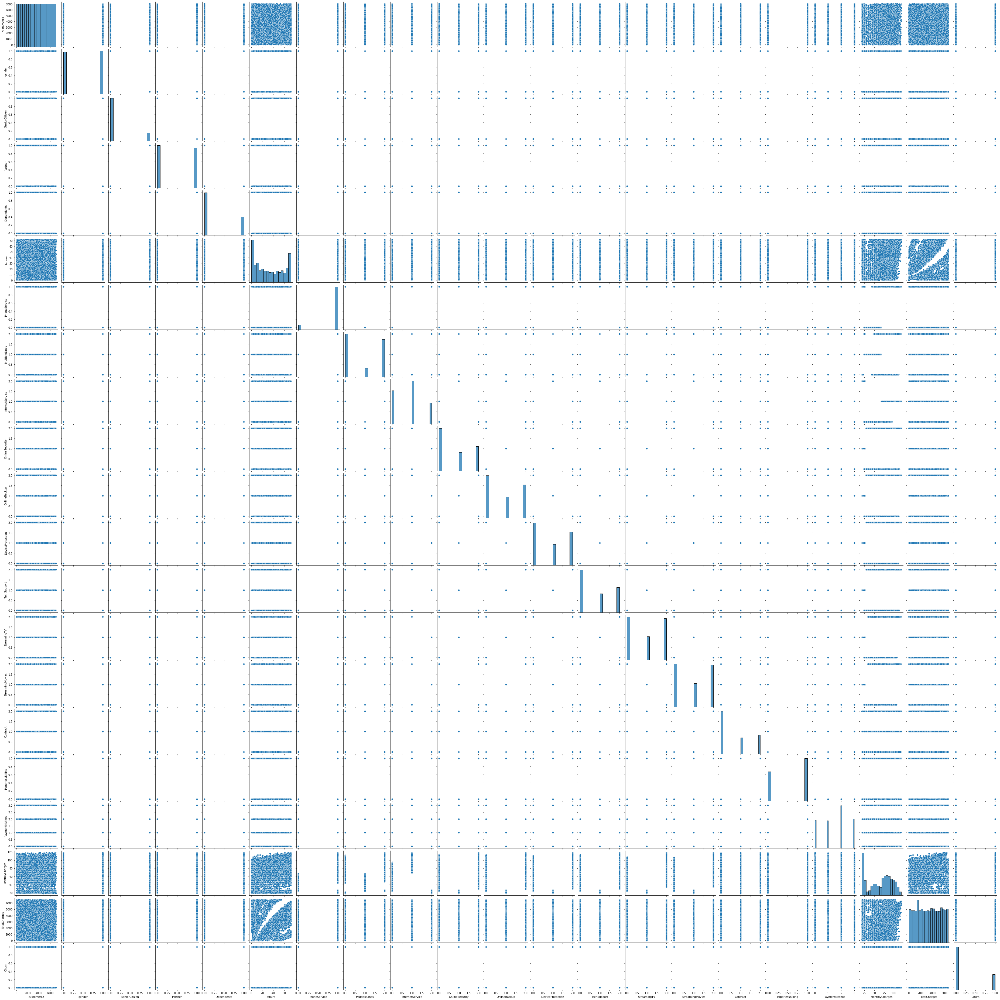

In [81]:
#Drawing Pairplot
sns.pairplot(data)
plt.show()

In [82]:
#In pairplot we cannot understand properly

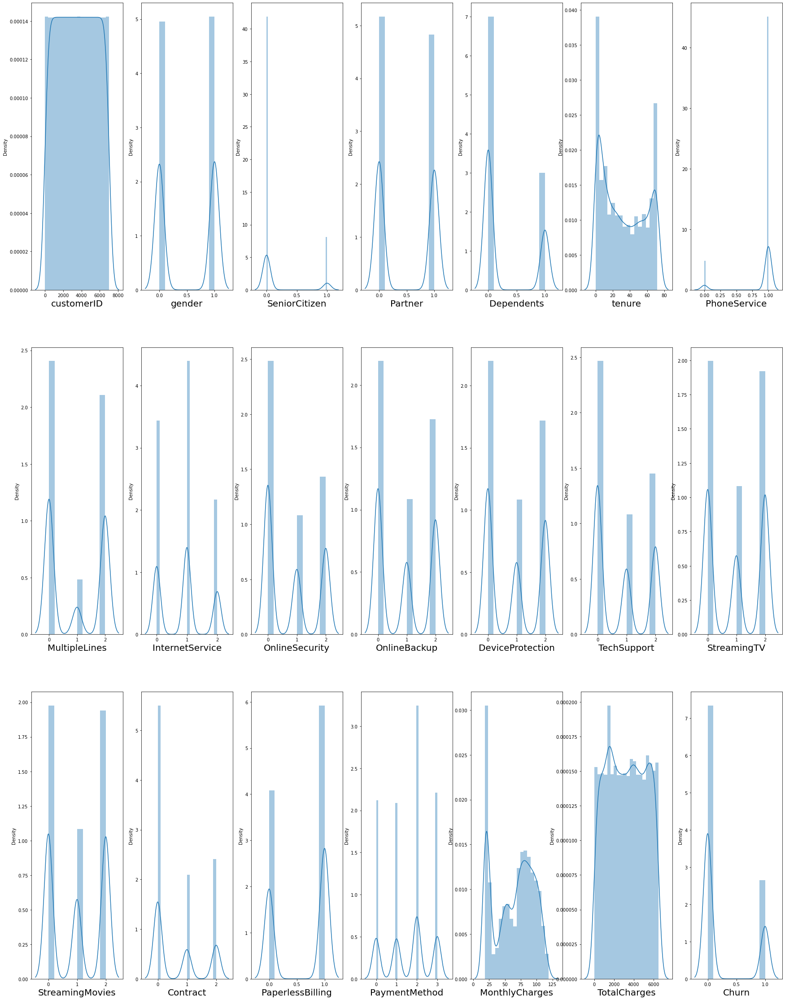

In [83]:
# let's see how data for every column
plt.figure(figsize=(30,40), facecolor='white')
plotnumber = 1

for column in data:
    if plotnumber<=21 :     # as there are 18 columns in the data
        ax = plt.subplot(3,7,plotnumber)
        sns.distplot(data[column])
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()

In [84]:
# dataset look line normal disturbution

In [85]:
data.skew()

customerID          0.000000
gender             -0.019031
SeniorCitizen       1.833633
Partner             0.067922
Dependents          0.875199
tenure              0.239540
PhoneService       -2.727153
MultipleLines       0.118719
InternetService     0.205423
OnlineSecurity      0.416985
OnlineBackup        0.182930
DeviceProtection    0.186847
TechSupport         0.402365
StreamingTV         0.028486
StreamingMovies     0.014657
Contract            0.630959
PaperlessBilling   -0.375396
PaymentMethod      -0.170129
MonthlyCharges     -0.220524
TotalCharges        0.015857
Churn               1.063031
dtype: float64

In [86]:
# Now we split feature and label
x=data.drop("Churn",axis=1)
y=data["Churn"]

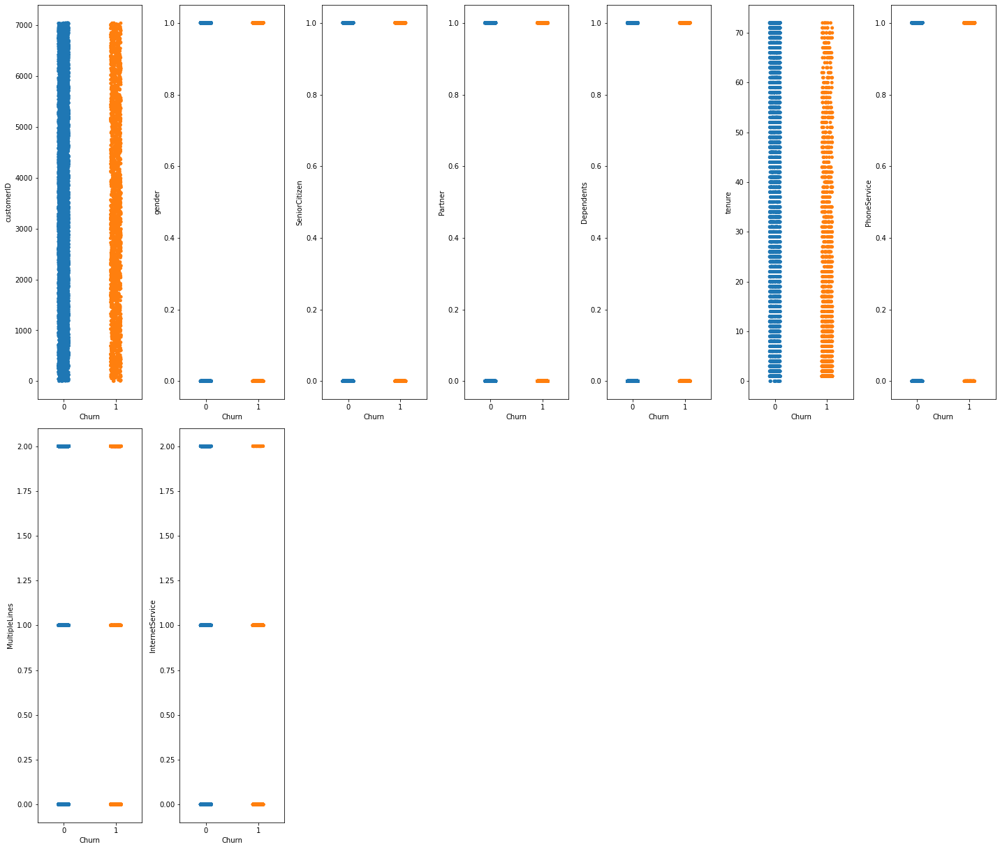

In [87]:
# let's see how data is distributed for every column
plt.figure(figsize=(20,25), facecolor='white')
plotnumber = 1

for column in x:
    if plotnumber<=9 :
        ax = plt.subplot(3,7,plotnumber)
        sns.stripplot(y,x[column])
    plotnumber+=1
plt.tight_layout()

In [88]:
# Now deal with data imbalance problem
from imblearn.over_sampling import SMOTE
sm=SMOTE()
x_over,y_over = sm.fit_resample(x,y)

In [89]:
y_over.value_counts()

1    5174
0    5174
Name: Churn, dtype: int64

In [90]:
# Now data is balance

In [91]:
from sklearn.preprocessing import StandardScaler
score =StandardScaler()
X_score = score.fit_transform(x_over)

In [92]:
# Dimension reduction Techique
from sklearn.decomposition import PCA
pca =PCA()
pca.fit_transform(X_score)

array([[-1.84307259,  0.72000706,  2.51777122, ..., -1.55884064,
         0.68421753,  0.34494572],
       [-0.58330556,  1.89288472,  0.43435844, ...,  0.8224093 ,
        -0.01131464, -0.04542353],
       [-1.78961546,  1.24565824,  0.32314648, ...,  0.14896229,
         0.61314031,  0.02205425],
       ...,
       [-2.43911539,  0.38811054, -0.41732163, ...,  0.27942513,
        -0.522971  ,  0.40332318],
       [-2.26996934, -0.20647737,  0.71246774, ...,  0.34440307,
         0.36002747, -0.29644967],
       [-2.46301797,  0.39948295,  2.53150367, ...,  0.09220173,
        -1.08983152,  0.32356104]])

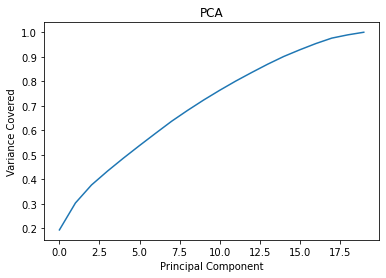

In [93]:
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Principal Component')
plt.ylabel('Variance Covered')
plt.title("PCA")
plt.show()

In [94]:
pca=PCA(n_components=17)
new_pcomp=pca.fit_transform(X_score)
princi_comp=pd.DataFrame(new_pcomp,columns=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11','PC12','PC13','PC14','PC15','PC16','PC17'])
princi_comp

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17
0,-1.843073,0.720007,2.517771,0.908973,0.813418,-0.082808,0.029925,-1.209887,1.204165,-0.676457,-0.185710,-2.183571,-0.363427,-0.055963,0.206236,0.092428,-0.162887
1,-0.583306,1.892885,0.434358,-0.641363,0.900733,-0.778515,-0.396725,0.933618,-0.234872,-0.175823,1.200331,1.453289,0.645670,-1.606597,-1.708776,-0.137061,-1.163864
2,-1.789615,1.245658,0.323146,0.456161,0.946519,-0.573536,0.002008,1.191200,0.276612,-2.845792,0.591687,-0.229612,1.126283,0.358198,-1.701524,0.085951,-0.229084
3,0.708839,2.144880,3.457501,-1.286267,1.039914,-1.550016,0.264509,0.507327,-1.545213,0.484464,-0.269085,1.245714,-0.465780,-1.012649,-0.140295,-0.211201,0.860042
4,-2.838931,0.088291,-0.531733,0.255270,-0.055883,-1.019223,-0.112240,-1.570488,-0.102336,-0.903886,-0.571697,0.341653,0.094006,-0.311097,0.042273,0.110711,-0.498086
5,-0.031215,-2.752997,-1.108923,-1.372013,0.323024,0.139397,-1.429387,-1.578115,0.254896,0.657522,0.248186,0.064593,-0.747452,-1.191793,-0.301519,-0.083652,0.742116
6,0.095880,-0.839344,-0.464116,1.612131,-0.228746,0.982995,0.322847,0.401594,-1.427555,-1.583727,0.703464,-1.648133,0.258847,0.632164,0.176891,-1.558410,1.284749
7,-2.432278,1.873156,2.403051,-0.822642,0.845406,-0.348325,-0.076339,-0.510016,1.186560,0.255043,1.236402,0.322197,-1.259012,0.439943,-1.515272,-0.251598,0.285239
8,1.489589,-1.832029,-0.694612,-0.688652,0.629937,0.692629,-0.299955,-1.949438,-0.037213,-0.448478,0.283842,1.379434,-0.217901,-0.890230,1.303163,0.167851,0.227771
9,0.882580,2.020354,1.458249,1.038828,-1.165213,-1.589574,-0.563304,0.767621,-1.016046,-0.001936,0.200045,-0.836758,1.445589,0.934850,-1.384566,-0.035193,0.153698


In [95]:
#Checking for best random state which give best accuracy
# To find the best random state using logistic Regressor model
from sklearn.linear_model import LogisticRegression

maxAccu=0
maxRS=0
for i in range(1,100):
    x_train,x_test,y_train,y_test=train_test_split(princi_comp,y_over,test_size=.30,random_state=i)
    mod= LogisticRegression()
    mod.fit(x_train,y_train)
    pred=mod.predict(x_test)
    acc=accuracy_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print ('best accuracy is',maxAccu,'on random state',maxRS)

best accuracy is 0.8193236714975846 on random state 71


In [96]:
x_train,x_test,y_train,y_test=train_test_split(princi_comp,y_over,test_size=.30,random_state=maxRS)

In [97]:
# Logistic model for training
from sklearn.linear_model import LogisticRegression

log = LogisticRegression()

log.fit(x_train,y_train)

log_score =log.score(x_train,y_train)

print ('Logistic training Score ==>', log_score)

log_pred = log.predict(x_test)

log_cfm=confusion_matrix(y_test,log_pred)

log_accuracy = accuracy_score(y_test, log_pred)

print("Testing accuracy :", log_accuracy)

print(classification_report(y_test,log_pred))

log_cvs=cross_val_score(LogisticRegression(),x,y,cv=5).mean()
print("Cross_validation_score ----------",log_cvs)
log_Difference = (log_accuracy)*100 - (log_cvs)*100
print("Difference ----------",log_Difference)

Logistic training Score ==> 0.7956647797873809
Testing accuracy : 0.8193236714975846
              precision    recall  f1-score   support

           0       0.85      0.78      0.81      1562
           1       0.79      0.86      0.83      1543

    accuracy                           0.82      3105
   macro avg       0.82      0.82      0.82      3105
weighted avg       0.82      0.82      0.82      3105

Cross_validation_score ---------- 0.7952574561262017
Difference ---------- 2.4066215371382924


In [98]:
#  SVC model for training
from sklearn.svm import SVC

svc = SVC()

svc.fit(x_train,y_train)

svc_score =svc.score(x_train,y_train)

print ('SVC training Score ==>', svc_score)

svc_pred = svc.predict(x_test)

svc_cfm=confusion_matrix(y_test,svc_pred)


svc_accuracy = accuracy_score(y_test, svc_pred)


print("Testing accuracy :", svc_accuracy)


print(classification_report(y_test,svc_pred))

svc_cvs=cross_val_score(SVC(),x,y,cv=5).mean()
print("Cross_validation_score ----------",svc_cvs)
svc_Difference = (svc_accuracy)*100 - (svc_cvs)*100
print("Difference ----------",svc_Difference)

SVC training Score ==> 0.8559988954852962
Testing accuracy : 0.8483091787439614
              precision    recall  f1-score   support

           0       0.86      0.83      0.85      1562
           1       0.84      0.86      0.85      1543

    accuracy                           0.85      3105
   macro avg       0.85      0.85      0.85      3105
weighted avg       0.85      0.85      0.85      3105

Cross_validation_score ---------- 0.7346301575908123
Difference ---------- 11.367902115314905


In [99]:
# Knn Classifier
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=5)

knn.fit(x_train,y_train)

knn_score = knn.score(x_train,y_train)

print ('KNeighborsClassifier training Score ==>', knn_score)

# Importing test set for prediction

knn_pred = knn.predict(x_test)

knn_cfm=confusion_matrix(y_test,knn_pred)

knn_accuracy =  accuracy_score(y_test,knn_pred)


print("Testing accuracy :", knn_accuracy)


print(classification_report(y_test,knn_pred))

knn_cvs = cross_val_score(KNeighborsClassifier(),x,y,cv=5).mean()

print("Cross_validation_score ----------",knn_cvs)
knn_Difference = (knn_accuracy)*100 - (knn_cvs)*100
print("Difference ----------",knn_Difference)

KNeighborsClassifier training Score ==> 0.8608311473146486
Testing accuracy : 0.7974235104669888
              precision    recall  f1-score   support

           0       0.85      0.73      0.78      1562
           1       0.76      0.87      0.81      1543

    accuracy                           0.80      3105
   macro avg       0.80      0.80      0.80      3105
weighted avg       0.80      0.80      0.80      3105

Cross_validation_score ---------- 0.6836552963094393
Difference ---------- 11.376821415754932


In [100]:
# AdaBoostClassifier
from sklearn.ensemble import AdaBoostClassifier

abc=AdaBoostClassifier()

abc.fit(x_train, y_train)

abc_score = (abc.score(x_train, y_train))

print('AdaBoostClassifier training Score ==>',abc_score)

# Importing test set for prediction

abc_pred = abc.predict(x_test)

abc_cfm=confusion_matrix(y_test,abc_pred)

abc_accuracy = accuracy_score(y_test,abc_pred)

print("Testing accuracy :", abc_accuracy)

print(classification_report(y_test,abc_pred))

abc_cvs = cross_val_score(AdaBoostClassifier(),x,y,cv=5).mean()

print("Cross_validation_score ----------",abc_cvs)
abc_Difference = (abc_accuracy)*100 - (abc_cvs)*100
print("Difference ----------",abc_Difference)

AdaBoostClassifier training Score ==> 0.8177550738644208
Testing accuracy : 0.8247987117552334
              precision    recall  f1-score   support

           0       0.84      0.81      0.82      1562
           1       0.81      0.84      0.83      1543

    accuracy                           0.82      3105
   macro avg       0.83      0.82      0.82      3105
weighted avg       0.83      0.82      0.82      3105

Cross_validation_score ---------- 0.8003697819214143
Difference ---------- 2.4428929833819097


In [101]:
# DecisionTreeClassifier
from sklearn.tree import DecisionTreeClassifier

decision_tree = DecisionTreeClassifier()

decision_tree.fit(x_train, y_train)

dt_score = (decision_tree.score(x_train, y_train))

print('Decision Tree training Score ==>',dt_score)

# Importing test set for prediction

dt_pred = decision_tree.predict(x_test)

dt_cfm=confusion_matrix(y_test,dt_pred)

dt_accuracy = accuracy_score(y_test,dt_pred)

print("Testing accuracy :", dt_accuracy)

print(classification_report(y_test,dt_pred))

dt_cvs = cross_val_score(DecisionTreeClassifier(),x,y,cv=5).mean()

print("Cross_validation_score ----------",dt_cvs)
dt_Difference = (dt_accuracy)*100 - (dt_cvs)*100
print("Difference ----------",dt_Difference)

Decision Tree training Score ==> 1.0
Testing accuracy : 0.759098228663446
              precision    recall  f1-score   support

           0       0.77      0.74      0.76      1562
           1       0.75      0.78      0.76      1543

    accuracy                           0.76      3105
   macro avg       0.76      0.76      0.76      3105
weighted avg       0.76      0.76      0.76      3105

Cross_validation_score ---------- 0.7266790397767597
Difference ---------- 3.2419188886686214


In [102]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier()

rfc.fit(x_train, y_train)

rfc_score = (rfc.score(x_train, y_train))

print('RandomForest training Score ==>',rfc_score)

# Importing test set for prediction

rfc_pred = rfc.predict(x_test)

rfc_accuracy = accuracy_score(y_test,rfc_pred)

print("Testing accuracy :", rfc_accuracy)

rfc_cfm=confusion_matrix(y_test,dt_pred)

print(classification_report(y_test,rfc_pred))

rfc_cvs = cross_val_score(rfc,x,y,cv=5).mean()

print("Cross_validation_score ----------",rfc_cvs)

rfc_Difference = (rfc_accuracy)*100 - (rfc_cvs)*100
print("Difference ----------",rfc_Difference)

RandomForest training Score ==> 1.0
Testing accuracy : 0.8528180354267311
              precision    recall  f1-score   support

           0       0.86      0.84      0.85      1562
           1       0.84      0.86      0.85      1543

    accuracy                           0.85      3105
   macro avg       0.85      0.85      0.85      3105
weighted avg       0.85      0.85      0.85      3105

Cross_validation_score ---------- 0.7946909881282662
Difference ---------- 5.812704729846487


In [103]:
from sklearn.naive_bayes import GaussianNB
gnb=GaussianNB()

gnb.fit(x_train, y_train)

gnb_score = (gnb.score(x_train, y_train))

print('GaussianNB training Score ==>',gnb_score)

# Importing test set for prediction

gnb_pred = gnb.predict(x_test)

gnb_accuracy = accuracy_score(y_test,gnb_pred)


print("Testing accuracy :", gnb_accuracy)


gnb_cfm=confusion_matrix(y_test,dt_pred)

print(classification_report(y_test,gnb_pred))

gnb_cvs = cross_val_score(gnb,x,y,cv=5).mean()

print("Cross_validation_score ----------",gnb_cvs)
gnb_Difference = (gnb_accuracy)*100 - (gnb_cvs)*100
print("Difference ----------",gnb_Difference)


GaussianNB training Score ==> 0.800082838602789
Testing accuracy : 0.8225442834138487
              precision    recall  f1-score   support

           0       0.82      0.83      0.83      1562
           1       0.83      0.81      0.82      1543

    accuracy                           0.82      3105
   macro avg       0.82      0.82      0.82      3105
weighted avg       0.82      0.82      0.82      3105

Cross_validation_score ---------- 0.7550756298793471
Difference ---------- 6.746865353450161


In [104]:
models = pd.DataFrame({'Classifier':['LogisticRegression', 'SVC', 'KNeighborsClassifier','AdaBoostClassifier','DecisionTreeClassifier', 'RandomForestClassifier','GaussianNB'],
                      'Score':[log_accuracy,svc_accuracy,knn_accuracy,abc_accuracy,dt_accuracy,rfc_accuracy,gnb_accuracy],
                       'CVS':[log_cvs,svc_cvs,knn_cvs,abc_cvs,dt_cvs,rfc_cvs,gnb_cvs],
                       'Difference':[log_Difference,svc_Difference,knn_Difference,abc_Difference,dt_Difference,rfc_Difference,gnb_Difference]
                       
})
models.sort_values(by='Score',ascending=False)

,Classifier,Score,CVS,Difference
5,RandomForestClassifier,0.852818,0.794691,5.812705
1,SVC,0.848309,0.734630,11.367902
3,AdaBoostClassifier,0.824799,0.800370,2.442893
6,GaussianNB,0.822544,0.755076,6.746865
0,LogisticRegression,0.819324,0.795257,2.406622
2,KNeighborsClassifier,0.797424,0.683655,11.376821
4,DecisionTreeClassifier,0.759098,0.726679,3.241919


In [105]:
#Now we find ROC, AUC score

In [106]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score,roc_auc_score,plot_roc_curve,roc_curve

In [107]:
# LogisticRegression
roc_auc_score(y_test, log.predict(x_test))

0.819559316661176

In [108]:
# SVC Classifier
roc_auc_score(y_test,svc.predict(x_test))

0.8483921854345302

In [109]:
# AdaBoostClassifier
roc_auc_score(y_test,abc.predict(x_test))

0.8248828089019593

In [110]:
# DecisionTreeClassifier
roc_auc_score(y_test,decision_tree.predict(x_test))

0.7592074570797198

In [111]:
# RandomForestClassifier
roc_auc_score(y_test,svc.predict(x_test))

0.8483921854345302

In [112]:
# GaussianNBClassifier
roc_auc_score(y_test,gnb.predict(x_test))

0.8224883680211239

In [113]:
#Let's check ROC, AUC Curve for the fitted model

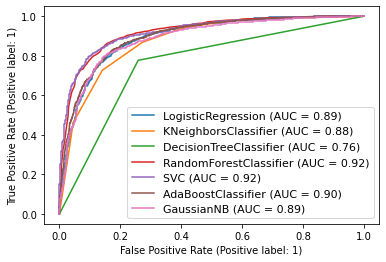

In [114]:
disp = plot_roc_curve(log, x_test, y_test)
plot_roc_curve(knn, x_test, y_test, ax = disp.ax_) # ax_ = Axes with confusion matrix
plot_roc_curve(decision_tree, x_test, y_test, ax = disp.ax_)
plot_roc_curve(rfc, x_test, y_test, ax = disp.ax_)
plot_roc_curve(svc, x_test, y_test, ax = disp.ax_)
plot_roc_curve(abc, x_test, y_test, ax = disp.ax_)
plot_roc_curve(gnb, x_test, y_test, ax = disp.ax_)

plt.legend(prop = {'size':11}, loc = 'lower right')
plt.show()

In [115]:
# #we see that AdaBoostClassifier  is best model and also give highest accuracy 82% and least difference between accuracy and  cross validation

In [116]:
# Hyperparameter tunning the machine Learning Model

In [117]:
grid_param={'n_estimators':np.arange(1,100), 
            'algorithm':['SAMME', 'SAMME.R'],
            'learning_rate':np.arange(0,2)}

In [118]:
grid_Search=GridSearchCV(AdaBoostClassifier(),grid_param,cv=5)

In [119]:
grid_Search.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=AdaBoostClassifier(),
             param_grid={'algorithm': ['SAMME', 'SAMME.R'],
                         'learning_rate': array([0, 1]),
                         'n_estimators': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
       52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68,
       69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85,
       86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99])})

In [120]:
grid_Search.best_params_

{'algorithm': 'SAMME.R', 'learning_rate': 1, 'n_estimators': 99}

In [123]:
abc=grid_Search.best_estimator_

In [124]:
abc.score(x_train,y_train)

0.8281098992130332

In [125]:
y_predict = abc.predict(x_test)

In [126]:
accuracy_score(y_test,y_predict)

0.8318840579710145

In [128]:
print(confusion_matrix(y_test,y_predict))

[[1271  291]
 [ 231 1312]]


In [131]:
print(classification_report(y_test,y_predict))

              precision    recall  f1-score   support

           0       0.85      0.81      0.83      1562
           1       0.82      0.85      0.83      1543

    accuracy                           0.83      3105
   macro avg       0.83      0.83      0.83      3105
weighted avg       0.83      0.83      0.83      3105



In [132]:
#Saving the model
import joblib 
joblib.dump(abc,"Telecom_customer_churn")


['Telecom_customer_churn']